In [1]:
#ngboost and modelling libraries
from ngboost import NGBClassifier
from ngboost.distns import Bernoulli
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import roc_auc_score, roc_curve, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from collections import Counter

#data manipulation libraries
import pandas as pd
import numpy as np

from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

#import functions and constants
from utils import (register_imputation, preprocess_df, 
                    scaling_values_df, clean_outliers, get_sample_weights, 
                  process_unit_cost, cost_score, generate_y_pred_with_custom_threshold, check_counts,)
from plot_utils import (correlation_heatmap, visualize_permutation_feature_importances, 
                        plot_target_balance, plot_trace_line, plot_scatter_matrix, 
                        plot_feature_importances, visualize_roc_curve, color_negative_red, )

from constants import cols, cols_with_missing_indicators

In [2]:
SEED = 2020

In [3]:
df = pd.read_csv("./data/cs-training.csv", usecols =cols)

In [4]:
from sklearn.model_selection import train_test_split

df, df_test = train_test_split(df, test_size=0.2,random_state=42)

In [5]:
df = clean_outliers(df.copy(), True)

In [6]:
X_train = df.drop(columns=['SeriousDlqin2yrs']).values
y_train = df.SeriousDlqin2yrs.values

In [7]:
nm_common =SMOTE(random_state=2019)
X_train_resampled, y_train_resampled = nm_common.fit_sample(X_train, y_train)
print("Resampled dataset shape {}".format(Counter(y_train_resampled)))

Resampled dataset shape Counter({0: 101298, 1: 101298})


In [14]:
#del ngb_test
ngb_clf = NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True, tol=0.0001,
              verbose=True, verbose_eval=0)

ngb_clf.fit(X_train_resampled, y_train_resampled, sample_weight= get_sample_weights(y_train, y_train_resampled))
#preds = ngb_clf.pred_dist(X_test)

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,
              random_state=RandomState(MT1

In [9]:
import pickle
pkl_filename = "ngb_clf_primer_exp.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(ngb_clf, file)

# Load from file
with open(pkl_filename, 'rb') as file:
    ngb_clf = pickle.load(file)

In [13]:
ngb_clf

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=150,
              natural_gradient=True,
              random_state=RandomState(MT1

In [10]:
df_test = register_imputation(df_test.copy())

In [11]:
X_test = df_test.drop(columns=['SeriousDlqin2yrs']).values
y_test = df_test.SeriousDlqin2yrs.values

In [39]:
df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
df_aux['predicted'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.2)
df_aux['real'] = list(y_test)
df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2
cost_score(df_aux.LoanPrincipal, df_aux.predicted, df_aux.real)

count_zero 6553
count_one 23447


2443874.9999999925

In [40]:
df_collector.head(1)

,hyperparams,estimators,learning_rate,max_depth,threshold,cost,count_zero,count_one,train_auc,test_auc
0,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.2,2443875.0,6553,23447,0.851787,0.843578


In [15]:
visualize_roc_curve(ngb_clf, X_train, y_train, X_test, y_test)

TRAIN: ROC AUC=0.852
TEST: ROC AUC=0.844


In [20]:
plot_feature_importances(cols_with_missing_indicators, ngb_clf)

In [21]:
import eli5
from eli5 import show_weights
from eli5.sklearn import PermutationImportance

In [22]:
perm = PermutationImportance(ngb_clf).fit(X_test, y_test)
eli5.show_weights(perm, target_names = ['0', '1'], feature_names = cols_with_missing_indicators)

Weight,Feature
0.0171 ± 0.0024,MonthlyIncome
0.0142 ± 0.0010,NumberOfOpenCreditLinesAndLoans
0.0138 ± 0.0017,NumberRealEstateLoansOrLines
0.0109 ± 0.0006,MonthlyIncome_bool_missing
0.0021 ± 0.0019,NumberOfDependents
0.0011 ± 0.0009,age
0 ± 0.0000,age_bool_missing
0 ± 0.0000,NumberOfTime60-89DaysPastDueNotWorse_bool_missing
0 ± 0.0000,RevolvingUtilizationOfUnsecuredLines_bool_missing
0 ± 0.0000,NumberRealEstateLoansOrLines_bool_missing


In [23]:
visualize_permutation_feature_importances(ngb_clf, X_train, y_train)

Feature: 0, Score: -0.03397
Feature: 1, Score: 0.00000
Feature: 2, Score: -0.00245
Feature: 3, Score: 0.00000
Feature: 4, Score: -0.04558
Feature: 5, Score: 0.00000
Feature: 6, Score: 0.00906
Feature: 7, Score: 0.00000
Feature: 8, Score: 0.02435
Feature: 9, Score: 0.01504
Feature: 10, Score: 0.01323
Feature: 11, Score: 0.00000
Feature: 12, Score: -0.04097
Feature: 13, Score: 0.00000
Feature: 14, Score: 0.01208
Feature: 15, Score: 0.00000
Feature: 16, Score: -0.02155
Feature: 17, Score: 0.00000
Feature: 18, Score: 0.00182
Feature: 19, Score: -0.00415


In [24]:
import shap
shap.initjs()

## SHAP plot for loc trees
explainer = shap.TreeExplainer(ngb_clf) # use model_output = 1 for scale trees
shap_values = explainer.shap_values(X_train)

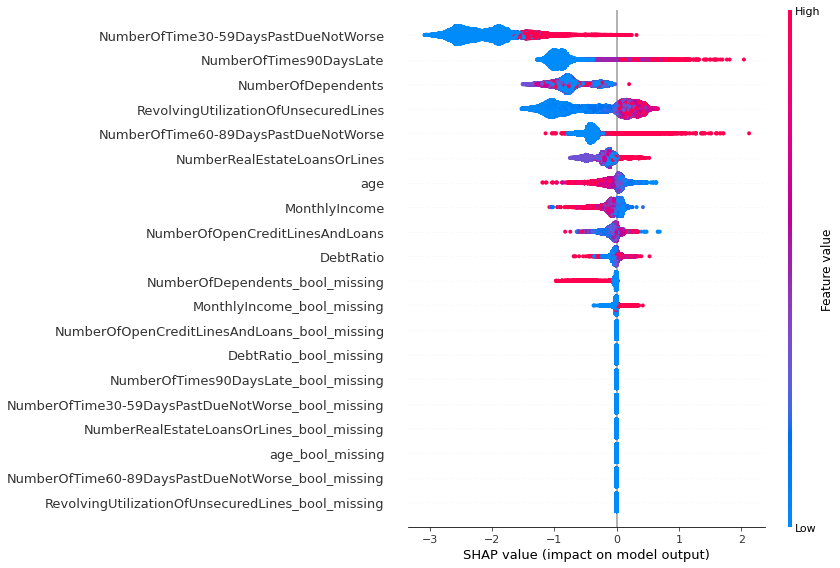

In [25]:

shap.summary_plot(shap_values, X_train, feature_names=cols_with_missing_indicators)

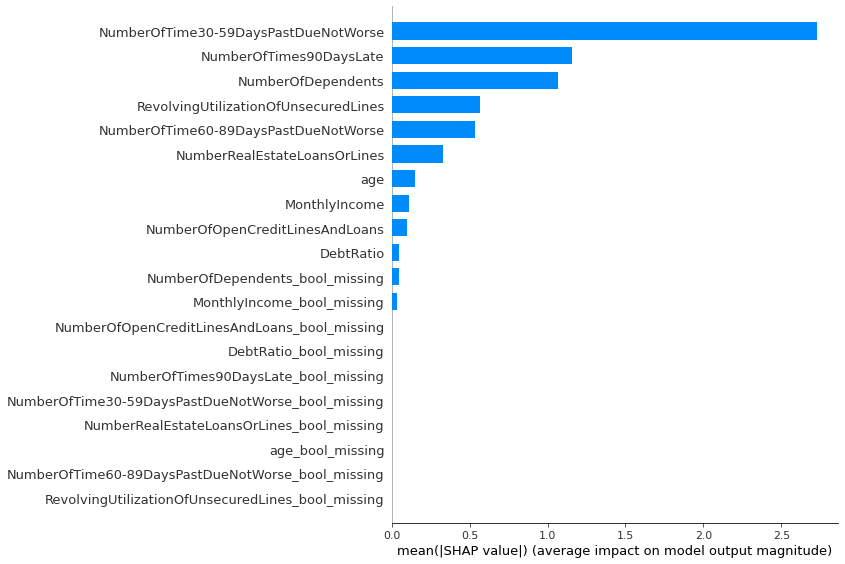

In [21]:
shap.summary_plot(shap_values, X_train, plot_type="bar", feature_names=cols_with_missing_indicators)

In [9]:
base1 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=4, random_state=2020)
base2 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=6, random_state=2020)
base3 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=8, random_state=2020)
base4 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=12, random_state=2020)
base5 = DecisionTreeRegressor(criterion="friedman_mse", max_depth=16, random_state=2020)

In [13]:
#FIX MEEEEEEEEEEE: REFACTOR PLZZ !!! sss
df_collector = pd.DataFrame(columns=  ["hyperparams", "estimators", "learning_rate", "max_depth", 
                                       "threshold", "cost", "count_zero", "count_one", "train_auc", "test_auc"])
df_collector['hyperparams'] = df_collector['hyperparams'].astype('object')
k = 0
for estimator in [50, 100, 150, 250, 350, 500]:
    for lr in [0.01, 0.001]:
        for baset in [base1,base2,base3,base4,base5]:
            ngb_clf = NGBClassifier(Dist=Bernoulli,
                                      verbose=True, Base=baset, n_estimators = estimator, random_state=2020,
                                    learning_rate = lr, verbose_eval = 0
                                     )
            print(ngb_clf)
            ngb_clf.fit(X_train_resampled, y_train_resampled, sample_weight= get_sample_weights(y_train, y_train_resampled))
            index_th = 0
            for threshold in list(np.arange(0.2, 0.35, 0.05)):
                df_collector.ix[str(k),'hyperparams'] = ngb_clf
                df_collector.ix[str(k),'estimators'] = estimator
                df_collector.ix[str(k),'learning_rate'] = lr
                df_collector.ix[str(k),'max_depth'] = baset.max_depth
                threshold = round(threshold,2)
                print("k: "+str(k))
                df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
                df_aux['predicted'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, threshold)
                df_aux['real'] = list(y_test)
                df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2
                print(threshold)
                print("cost "+str(cost_score(df_aux.LoanPrincipal, df_aux.predicted, df_aux.real)))
                print("th "+str(threshold))
                df_collector.ix[str(k),'threshold'] = threshold
                df_collector.ix[str(k),'cost'] = cost_score(df_aux.LoanPrincipal, df_aux.predicted, df_aux.real)
                count_zero, count_one = check_counts(ngb_clf, X_test, threshold)
                df_collector.ix[str(k),'count_zero'] = count_zero
                df_collector.ix[str(k),'count_one'] = count_one
                # predict probabilities
                train_probs = ngb_clf.predict_proba(X_train)
                test_probs = ngb_clf.predict_proba(X_test)
                # keep probabilities for the positive outcome only
                train_probs = train_probs[:, 1]
                test_probs = test_probs[:, 1]
                # calculate scores
                train_auc = roc_auc_score(y_train, train_probs)
                test_auc = roc_auc_score(y_test, test_probs)
                df_collector.ix[str(k),'train_auc'] = train_auc
                df_collector.ix[str(k),'test_auc'] = test_auc
                k+=1
                print("sumando k")
                print("---------------------------------")
            del ngb_clf
df_collector.sort_values("cost").to_csv("caca_priemr_exp.csv", index=False)

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=4,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=50,
              natural_gradient=True,
              random_state=RandomState(MT19

k: 15
count_zero 0
count_one 30000
0.2
cost 2817421.839999991
th 0.2
sumando k
---------------------------------
k: 16
count_zero 0
count_one 30000
0.25
cost 2817421.839999991
th 0.25
sumando k
---------------------------------
k: 17
count_zero 0
count_one 30000
0.3
cost 2817421.839999991
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=6,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_sta

k: 33
count_zero 959
count_one 29041
0.2
cost 2781904.319999989
th 0.2
sumando k
---------------------------------
k: 34
count_zero 2937
count_one 27063
0.25
cost 2718706.1799999927
th 0.25
sumando k
---------------------------------
k: 35
count_zero 4988
count_one 25012
0.3
cost 2702228.1799999936
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         

k: 51
count_zero 0
count_one 30000
0.2
cost 2817421.839999991
th 0.2
sumando k
---------------------------------
k: 52
count_zero 0
count_one 30000
0.25
cost 2817421.839999991
th 0.25
sumando k
---------------------------------
k: 53
count_zero 0
count_one 30000
0.3
cost 2817421.839999991
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=12,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_st

k: 69
count_zero 12897
count_one 17103
0.2
cost 3695937.059999989
th 0.2
sumando k
---------------------------------
k: 70
count_zero 14358
count_one 15642
0.25
cost 4121675.67999998
th 0.25
sumando k
---------------------------------
k: 71
count_zero 15738
count_one 14262
0.3
cost 4498248.86
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=16,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         rando

k: 87
count_zero 0
count_one 30000
0.2
cost 2817421.839999991
th 0.2
sumando k
---------------------------------
k: 88
count_zero 0
count_one 30000
0.25
cost 2817421.839999991
th 0.25
sumando k
---------------------------------
k: 89
count_zero 0
count_one 30000
0.3
cost 2817421.839999991
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=4,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_sta

k: 105
count_zero 0
count_one 30000
0.2
cost 2817421.839999991
th 0.2
sumando k
---------------------------------
k: 106
count_zero 0
count_one 30000
0.25
cost 2817421.839999991
th 0.25
sumando k
---------------------------------
k: 107
count_zero 0
count_one 30000
0.3
cost 2817421.839999991
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=6,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_

k: 123
count_zero 1772
count_one 28228
0.2
cost 2759325.2799999896
th 0.2
sumando k
---------------------------------
k: 124
count_zero 3954
count_one 26046
0.25
cost 2722260.3599999943
th 0.25
sumando k
---------------------------------
k: 125
count_zero 5784
count_one 24216
0.3
cost 2611003.7599999937
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                    

k: 141
count_zero 30
count_one 29970
0.2
cost 2814000.37999999
th 0.2
sumando k
---------------------------------
k: 142
count_zero 699
count_one 29301
0.25
cost 2793988.5399999926
th 0.25
sumando k
---------------------------------
k: 143
count_zero 3444
count_one 26556
0.3
cost 2669149.879999993
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=12,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         

k: 159
count_zero 14838
count_one 15162
0.2
cost 4121976.5799999847
th 0.2
sumando k
---------------------------------
k: 160
count_zero 16088
count_one 13912
0.25
cost 4569401.360000006
th 0.25
sumando k
---------------------------------
k: 161
count_zero 17286
count_one 12714
0.3
cost 4979083.480000029
th 0.3
sumando k
---------------------------------
NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=16,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                  

k: 177
count_zero 14825
count_one 15175
0.2
cost 4978355.960000031
th 0.2
sumando k
---------------------------------
k: 178
count_zero 17240
count_one 12760
0.25
cost 5983584.400000065
th 0.25
sumando k
---------------------------------
k: 179
count_zero 19064
count_one 10936
0.3
cost 6954005.140000063
th 0.3
sumando k
---------------------------------


In [17]:
df_collector.sort_values("cost").head(50)

,hyperparams,estimators,learning_rate,max_depth,threshold,cost,count_zero,count_one,train_auc,test_auc
66,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.2,2.44387e+06,6553,23447,0.851787,0.843578
96,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,8,0.2,2.4892e+06,7619,22381,0.854215,0.84544
37,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,100,0.01,8,0.25,2.52417e+06,7441,22559,0.850251,0.84446
67,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.25,2.53141e+06,8308,21692,0.851787,0.843578
126,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,8,0.2,2.53865e+06,7859,22141,0.855083,0.845589
156,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,500,0.01,8,0.2,2.55085e+06,8084,21916,0.855843,0.845796
68,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.3,2.55235e+06,9786,20214,0.851787,0.843578
38,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,100,0.01,8,0.3,2.55497e+06,9116,20884,0.850251,0.84446
36,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,100,0.01,8,0.2,2.56438e+06,5234,24766,0.850251,0.84446
8,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,50,0.01,8,0.3,2.58329e+06,6571,23429,0.845352,0.843614


In [58]:
df_collector.sort_values("cost").head(50)

,hyperparams,estimators,learning_rate,max_depth,threshold,cost,count_zero,count_one,train_auc,test_auc
96,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,8,0.2,1.97152e+06,5987,18012,0.858859,0.844475
67,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.25,1.97572e+06,6478,17521,0.855973,0.843202
155,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,500,0.01,6,0.3,1.98241e+06,4956,19043,0.842107,0.849414
95,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,6,0.3,1.98384e+06,4705,19294,0.841684,0.8494
125,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,6,0.3,1.98588e+06,4939,19060,0.841958,0.849404
156,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,500,0.01,8,0.2,2.00219e+06,6731,17268,0.861096,0.843876
126,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,8,0.2,2.00436e+06,6438,17561,0.860082,0.844604
97,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,250,0.01,8,0.25,2.00558e+06,7611,16388,0.858859,0.844475
66,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,150,0.01,8,0.2,2.02139e+06,4789,19210,0.855973,0.843202
124,NGBClassifier(Base=DecisionTreeRegressor(ccp_a...,350,0.01,6,0.25,2.0222e+06,3244,20755,0.841958,0.849404


In [26]:
df_collector = pd.read_csv("caca_priemr_exp.csv")

In [100]:
print(df_collector.iloc[96].hyperparams)

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=250,
              natural_gradient=True,
              random_state=RandomState(MT1

In [97]:
ngb_clf

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=250,
              natural_gradient=True,
              random_state=RandomState(MT1

In [28]:
df_collector = df_collector[df_collector["threshold"] == 0.2]

In [29]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

def plot_hyperparams(df,first_col, second_col, lr, col_cost):
    """
    Plot lines with 'age' column as x axis and custom column (to compute sum/avg).
    """

    # Create and style traces
    trace0 = go.Scatter(
        x=df[df["learning_rate"]==lr][first_col],
        y=df[df["learning_rate"]==lr][second_col],
        name="Responsible (target=0)",mode="markers", 
        marker=dict(color=df[df["learning_rate"]==lr][col_cost],  size= 8,
                                  reversescale=True, colorscale='RdBu', showscale=True,  colorbar=dict(title='CostoPrimerExperimento'),),
        
    )
    data = [trace0]

    # Edit the layout
    layout = dict(
        xaxis=dict(title=f"{first_col}"),
        yaxis=dict(title=f"{second_col}"),
    )

    fig = go.Figure(dict(data=data, layout=layout))
    if lr==0.01:
        fig.update_layout(
            showlegend=False,
            annotations=[
                dict(
                    x=150,
                    y=8,
                    text="Best Model",
                    showarrow=True,
                    ax=0,
                    ay=-40,
                            arrowhead=2,
                )
            ]
        )
    iplot(fig)

In [30]:
plot_hyperparams(df_collector[df_collector["threshold"] == 0.2],"estimators", "max_depth", 0.01, "cost")

In [31]:
plot_hyperparams(df_collector[df_collector["threshold"] == 0.2],"estimators", "max_depth", 0.001, "cost")

In [40]:
ngb_clf

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=250,
              natural_gradient=True,
              random_state=RandomState(MT1

In [32]:
#FIX MEEEEEEEEEEE: REFACTOR PLZZ !!!
df_col = pd.DataFrame(columns=  ["threshold", "cost", "count_zero", "count_one"])
k = 0
for threshold in list(np.arange(0.05, 1, 0.05)):
    threshold = round(threshold,2)
    print("k: "+str(k))
    df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
    df_aux['predicted'] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, threshold)
    df_aux['real'] = list(y_test)
    df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2
    print(threshold)
    print("cost "+str(cost_score(df_aux.LoanPrincipal, df_aux.predicted, df_aux.real)))
    print("th "+str(threshold))
    df_col.ix[str(k),'threshold'] = threshold
    df_col.ix[str(k),'cost'] = cost_score(df_aux.LoanPrincipal, df_aux.predicted, df_aux.real)
    count_zero, count_one = check_counts(ngb_clf, X_test, threshold)
    df_col.ix[str(k),'count_zero'] = count_zero
    df_col.ix[str(k),'count_one'] = count_one
    k+=1
    print("sumando k")
    print("---------------------------------")


k: 0
count_zero 303
count_one 29697
0.05
cost 2788670.27999999
th 0.05
sumando k
---------------------------------
k: 1
count_zero 1998
count_one 28002
0.1
cost 2705948.8999999934
th 0.1
sumando k
---------------------------------
k: 2
count_zero 4241
count_one 25759
0.15
cost 2594765.279999992
th 0.15
sumando k
---------------------------------
k: 3
count_zero 6553
count_one 23447
0.2
cost 2443874.9999999925
th 0.2
sumando k
---------------------------------
k: 4
count_zero 8308
count_one 21692
0.25
cost 2531405.859999995
th 0.25
sumando k
---------------------------------
k: 5
count_zero 9786
count_one 20214
0.3
cost 2552349.2199999946
th 0.3
sumando k
---------------------------------
k: 6
count_zero 11146
count_one 18854
0.35
cost 2546171.479999997
th 0.35
sumando k
---------------------------------
k: 7
count_zero 12528
count_one 17472
0.4
cost 2629691.9999999977
th 0.4
sumando k
---------------------------------
k: 8
count_zero 13678
count_one 16322
0.45
cost 2931691.759999995
th

In [33]:
def plot_trace_line_cost(df):
    """
    Plot lines with 'age' column as x axis and custom column (to compute sum/avg).
    
    Args:
        - df (pd.DataFrame): DataFrame to be represented
    """

    # Create and style traces
    trace0 = go.Scatter(
        x=df.threshold,
        y=df.cost,
        name="Responsible (target=0)",
        line=dict(color="rgb(86,157, 242)", width=4),
    )
    data = [trace0]

    # Edit the layout
    layout = dict(
        title="Evolution of cost according to thresholds",
        xaxis=dict(title="threshold"),
        yaxis=dict(title="cost")
    )

    fig = dict(data=data, layout=layout)
    iplot(fig)

In [34]:
plot_trace_line_cost(df_col)

In [35]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

trace1 = go.Scatter(
        x=df_col.threshold,
        y=df_col.count_zero,
        name="Responsible (target = 0)",
        line=dict(color="blue", width=4),
    )

trace2 = go.Scatter(
        x=df_col.threshold,
        y=df_col.count_one,
        name="Delinquent (target = 1)",
        line=dict(color="red", width=4),
    )
data = [trace1, trace2]

# Edit the layout
layout = dict(
        xaxis=dict(title="threshold"),
        yaxis=dict(title=f"count"),
)

fig = dict(data=data, layout=layout)
iplot(fig)

In [38]:
df_col.to_csv("iter_th_first_model.csv", index=False)

In [36]:
df_col.to_csv("caca_fix_fix_kk_analysis_first_model.csv",index=False)

In [75]:
ngb_clf

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=250,
              natural_gradient=True,
              random_state=RandomState(MT1

In [17]:
probas = [prob[1] for prob in ngb_clf.predict_proba(X_test)]

In [18]:
df_prueba = pd.DataFrame()
df_prueba["y_pred"] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.2)
df_prueba["proba"] = probas


count_zero 6553
count_one 23447


In [72]:
df_prueba

,y_pred,proba
0,0,0.054671
1,0,0.104933
2,1,0.220435
3,1,0.476658
4,1,0.711320
...,...,...
29995,1,0.868121
29996,1,0.208649
29997,1,0.546995
29998,0,0.161736


In [73]:
import plotly.figure_factory as ff
# Add histogram data
x0 = df_prueba.loc[(df_prueba['y_pred']==0), 
            'proba']
x1 = df_prueba.loc[(df_prueba['y_pred']==1), 
            'proba']

# Group data together
hist_data = [x0, x1]

group_labels = ['Responsible (target=0)', 'Delinquent (target=1)']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

# Add title
fig.update_layout(title_text='Kernel Density Estimate',
              xaxis = dict(title = 'Proba predicted'),
              yaxis = dict(title = 'Probability Density'),
              )

In [19]:
import plotly.figure_factory as ff
# Add histogram data
x0 = df_prueba.proba

# Group data together
hist_data = [x0]

group_labels = ['Proba predicted']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2, show_hist=False)

# Add title
fig.update_layout(title_text='Kernel Density Estimate',
              xaxis = dict(title = 'Proba predicted'),
              yaxis = dict(title = 'Probability Density'),
              )

In [74]:
import seaborn as sns
sns.distplot(df_prueba.probas)

AttributeError: 'DataFrame' object has no attribute 'probas'

In [77]:
#del ngb_test
ngb_clf = NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=250,
              natural_gradient=True, tol=0.0001, random_state=2020,
              verbose=True, verbose_eval=0)

ngb_clf.fit(X_train_resampled, y_train_resampled, sample_weight= get_sample_weights(y_train, y_train_resampled))
#preds = ngb_clf.pred_dist(X_test)

NGBClassifier(Base=DecisionTreeRegressor(ccp_alpha=0.0,
                                         criterion='friedman_mse', max_depth=8,
                                         max_features=None, max_leaf_nodes=None,
                                         min_impurity_decrease=0.0,
                                         min_impurity_split=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         min_weight_fraction_leaf=0.0,
                                         presort='deprecated',
                                         random_state=2020, splitter='best'),
              Dist=<class 'ngboost.distns.categorical.k_categorical.<locals>.Categorical'>,
              Score=<class 'ngboost.scores.LogScore'>, col_sample=1.0,
              learning_rate=0.01, minibatch_frac=1.0, n_estimators=250,
              natural_gradient=True,
              random_state=RandomState(MT1

In [45]:
plot_feature_importances(cols_with_missing_indicators, ngb_clf)

In [46]:
perm = PermutationImportance(ngb_clf).fit(X_test, y_test)
eli5.show_weights(perm, target_names = ['0', '1'], feature_names = cols_with_missing_indicators)

Weight,Feature
0.0118 ± 0.0007,NumberOfOpenCreditLinesAndLoans
0.0090 ± 0.0010,MonthlyIncome
0.0082 ± 0.0010,MonthlyIncome_bool_missing
0.0073 ± 0.0015,NumberRealEstateLoansOrLines
0.0031 ± 0.0012,age
0 ± 0.0000,NumberOfTime30-59DaysPastDueNotWorse_bool_missing
0 ± 0.0000,NumberOfTime60-89DaysPastDueNotWorse_bool_missing
0 ± 0.0000,RevolvingUtilizationOfUnsecuredLines_bool_missing
0 ± 0.0000,NumberRealEstateLoansOrLines_bool_missing
0 ± 0.0000,NumberOfTimes90DaysLate_bool_missing


In [86]:
def process_clv_cost(x, rate):
    """
    CLV para los próximos 5 años (podría asumir más tiempo dependiendo el cambio inflacionario).
    Asumo que se pide un préstamo al año (se puede cambiar, por ejemplo teniendo en cuenta la edad). 
    Asumo que cada préstamo posee el mismo valor que el de hoy (tambien se podría cambiar..)
    Asumo que no cuento la pérdida (porque me da resultado negativo)
    Asumo la tasa de interes (1%), igual a la tasa de crédito del préstamo (se podría cambiar..). 
    Asumo también que lo que se paga en total no es el y_pred, sino, la proba de y_pred ("pago esperado/esperanza del pago")
    
    Args:
        - x (pd.Series): data to be identified with name column (real, predicted or LoanPrincipal)
        - rate (float): interest rate
        
    Loan * r + proba_pago - Loan * (1 - proba_pago)
        
    Returns for each case his CLV value.
    """
    clv =  x["LoanPrincipal"] * rate + (1 - x["proba"])
    return clv

In [87]:
probas = [prob[1] for prob in ngb_clf.predict_proba(X_test)]
df_aux = pd.DataFrame(X_test, columns=cols_with_missing_indicators)
df_aux['proba'] = probas
df_aux['LoanPrincipal'] = df_aux.MonthlyIncome * 2

In [88]:
sum(df_aux.apply(lambda x: process_clv_cost(x, 0.01), axis=1))

3196248.5884657754

In [90]:
check_counts(ngb_clf, X_test, 0.2)

(7619, 22381)

In [89]:
df_prueba = pd.DataFrame()
probas = [prob[1] for prob in ngb_clf.predict_proba(X_test)]
df_prueba["y_pred"] = generate_y_pred_with_custom_threshold(ngb_clf, X_test, 0.2)
df_prueba["proba"] = probas

count_zero 7619
count_one 22381


In [85]:
df_prueba.describe()

,y_pred,proba
count,30000.000000,30000.000000
mean,0.746033,0.471026
std,0.435286,0.283468
min,0.000000,0.005355
25%,0.000000,0.197692
50%,1.000000,0.478521
75%,1.000000,0.709408
max,1.000000,0.996961


In [101]:
df_collector_base

NameError: name 'df_collector_base' is not defined

In [42]:
dfp = pd.read_csv("caca_priemr_exp.csv")

In [47]:
dfp[dfp["threshold"] == 0.2].head(50).to_csv("cac_top_50_primer_modelo.csv", index=False)